In [ ]:
!nvidia-smi


Tue Sep 10 08:59:12 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   47C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.9/41.9 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 871.8/871.8 kB 44.6 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO
import os
from IPython.display import display,Image
from IPython import display
display.clear_output()
!yolo checks


Ultralytics YOLOv8.2.91 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 32.8/112.6 GB disk)

OS                  Linux-6.1.85+-x86_64-with-glibc2.35
Environment         Colab
Python              3.10.12
Install             pip
RAM                 12.67 GB
CPU                 Intel Xeon 2.00GHz
CUDA                12.1

numpy               ✅ 1.26.4<2.0.0,>=1.23.0
matplotlib          ✅ 3.7.1>=3.3.0
opencv-python       ✅ 4.10.0.84>=4.6.0
pillow              ✅ 9.4.0>=7.1.2
pyyaml              ✅ 6.0.2>=5.3.1
requests            ✅ 2.32.3>=2.23.0
scipy               ✅ 1.13.1>=1.4.1
torch               ✅ 2.4.0+cu121>=1.8.0
torchvision         ✅ 0.19.0+cu121>=0.9.0
tqdm                ✅ 4.66.5>=4.64.0
psutil              ✅ 5.9.5
py-cpuinfo          ✅ 9.0.0
pandas              ✅ 2.1.4>=1.1.4
seaborn             ✅ 0.13.1>=0.11.0
ultralytics-thop    ✅ 2.0.6>=2.0.0
torch               ✅ 2.4.0+cu121!=2.4.0,>=1.8.0; sys_platform == "win32"


In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="hWCsRFpNwpLzFb8QU6cH")
project = rf.workspace("media-xpert").project("media-xpert")
version = project.version(4)
dataset = version.download("yolov8")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 4.9 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.8
    Uninstalling idna-3.8:
      Successfully uninstalled idna-3.8
loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.2.91, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to Media-Xpert-4 in yolov8:: 100%|██████████| 8195/8195 [00:01<00:00, 5966.41it/s]


In [ ]:
!yolo task=detect mode=train model=yolov8m.pt data={dataset.location}/data.yaml epochs=20 imgsz=640

Ultralytics YOLOv8.2.91 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/Media-Xpert-4/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True

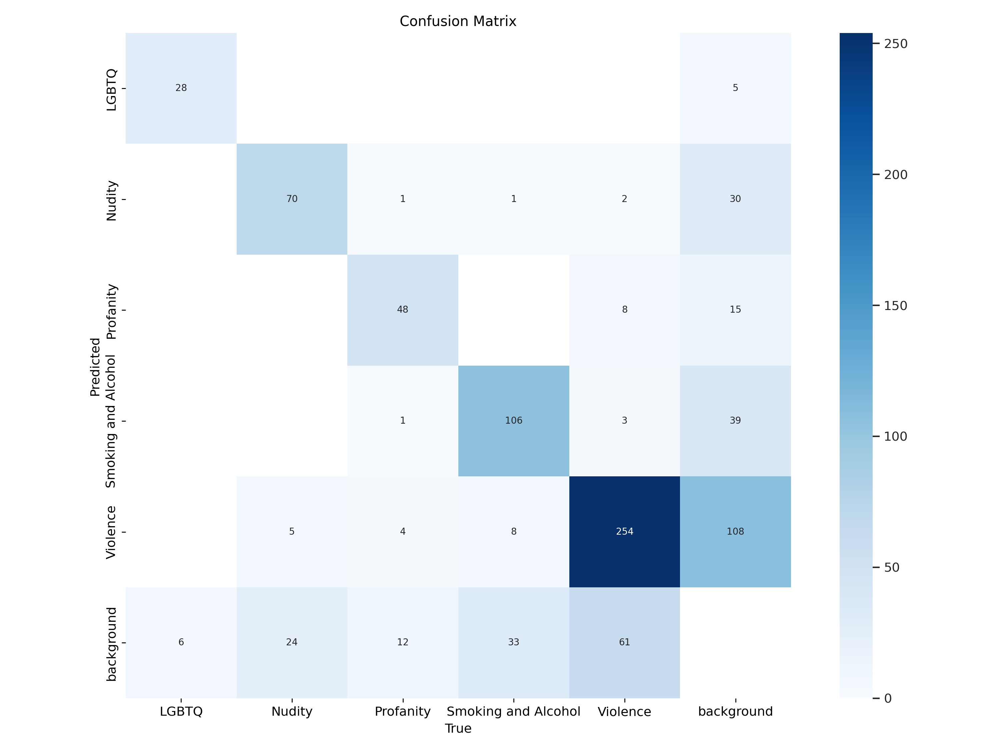

In [ ]:
Image(filename=f'{os.getcwd()}/runs/detect/train4/confusion_matrix.png',width=600)

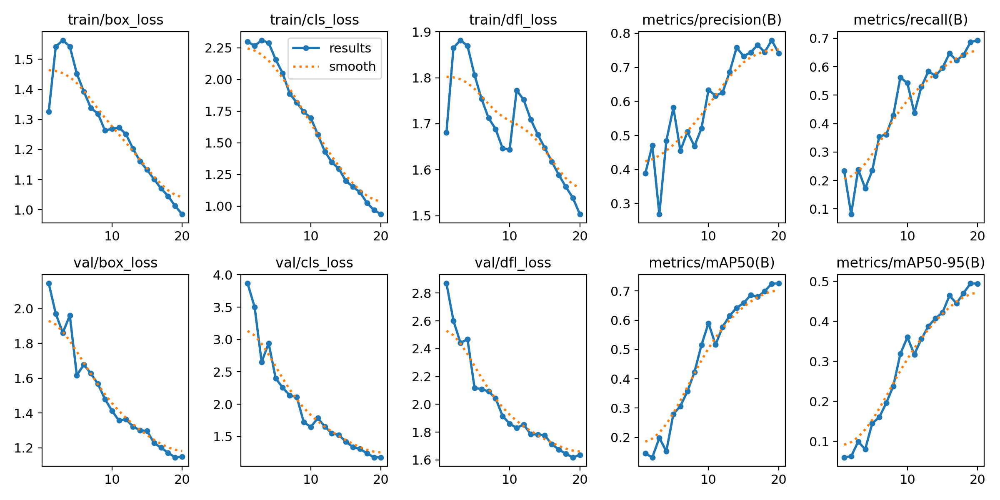

In [ ]:
Image(filename=f'{os.getcwd()}/runs/detect/train4/results.png',width=600)

In [ ]:
# !yolo task=detect mode=predict model={os.getcwd()}/runs/detect/train5/weights/best.pt source={dataset.location}/data.yaml

In [ ]:
!yolo task=detect mode=predict model={os.getcwd()}/runs/detect/train4/weights/best.pt conf=0.5 source={dataset.location}/train/images/

Ultralytics YOLOv8.2.91 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25,842,655 parameters, 0 gradients, 78.7 GFLOPs

image 1/3293 /content/Media-Xpert-4/train/images/-2024-08-10-2-51-34_png_jpg.rf.35d13d706e2f9814e7061612d8b7901e.jpg: 640x640 (no detections), 37.0ms
image 2/3293 /content/Media-Xpert-4/train/images/-2024-08-10-3-00-33_png_jpg.rf.47830a07c9dabaeba7b179a9018b8f97.jpg: 640x640 1 Nudity, 37.1ms
image 3/3293 /content/Media-Xpert-4/train/images/-2024-08-10-3-02-04_png_jpg.rf.eac930cb5c6e77460b7d9f9deffe8e40.jpg: 640x640 (no detections), 37.2ms
image 4/3293 /content/Media-Xpert-4/train/images/-2024-08-10-3-02-37_png_jpg.rf.c185c2d8ce41b4ac4431f9b707260881.jpg: 640x640 1 Nudity, 37.0ms
image 5/3293 /content/Media-Xpert-4/train/images/-2024-08-10-3-03-42_png_jpg.rf.7abc298813563e57d7e6592d9ca4cdc0.jpg: 640x640 1 Nudity, 37.0ms
image 6/3293 /content/Media-Xpert-4/train/images/-2024-08-10-3-09-17_png_jpg.rf.9254ec5b8d4fe0989195

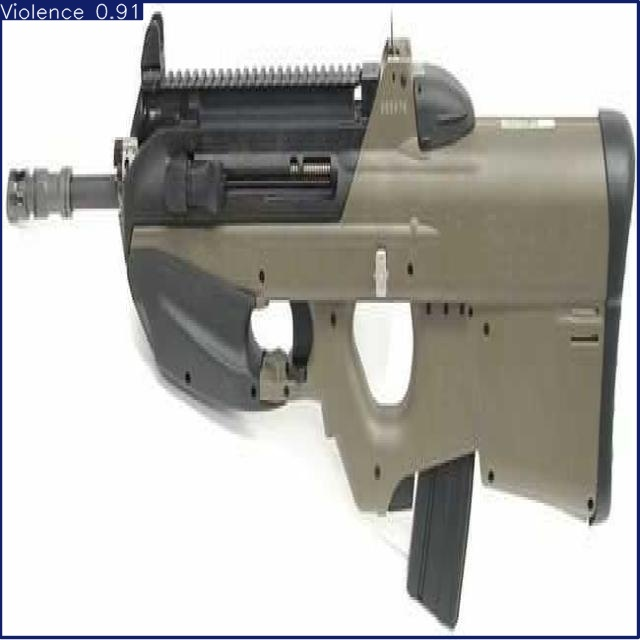

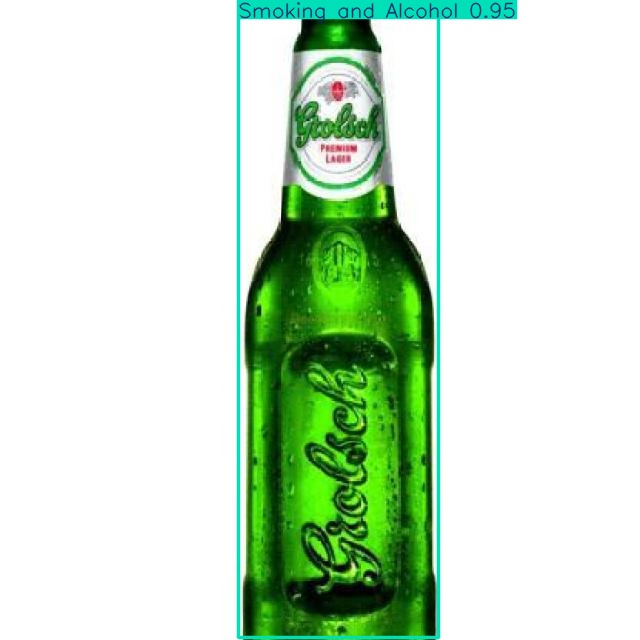

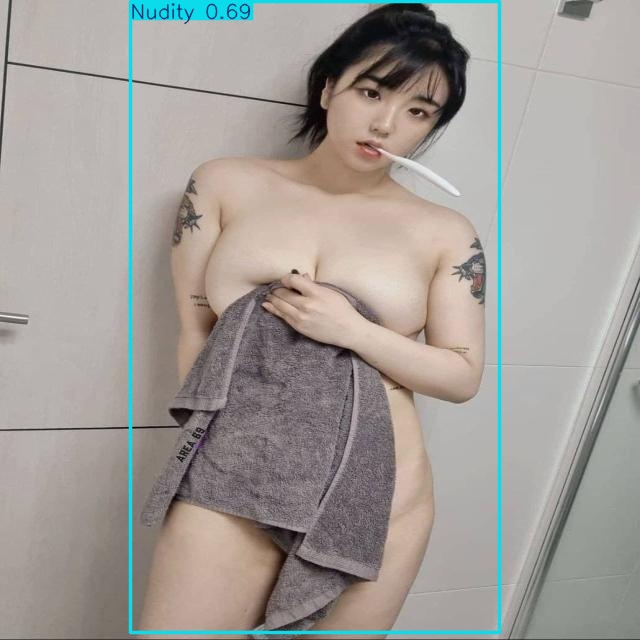

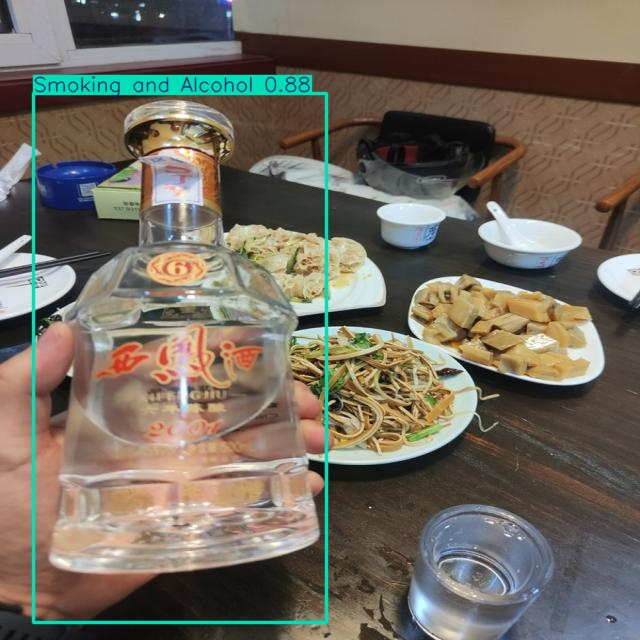

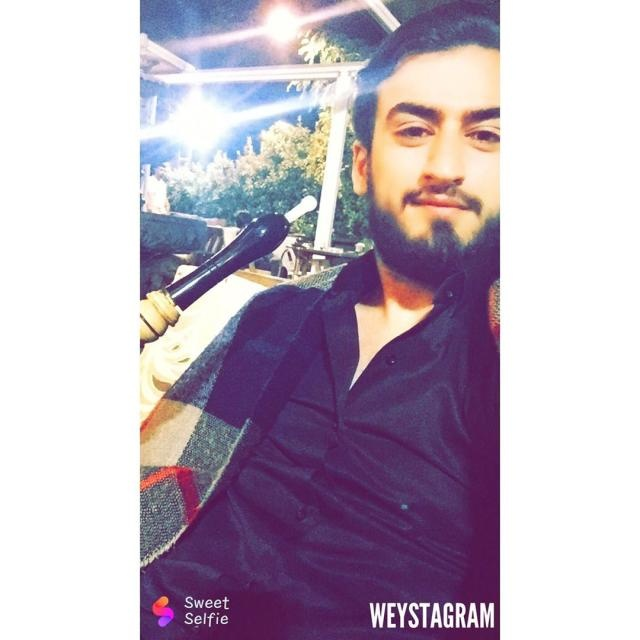

...

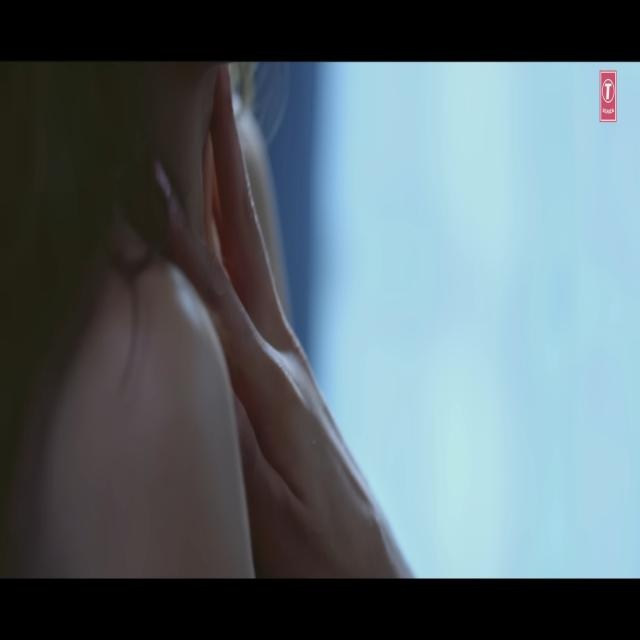

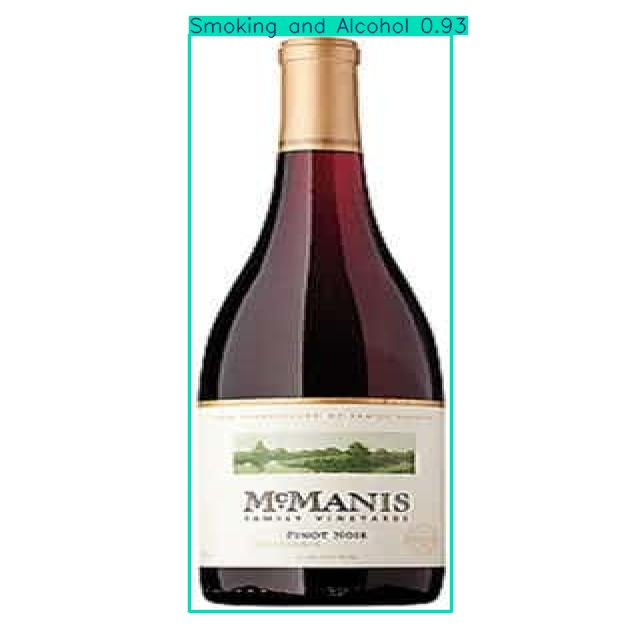

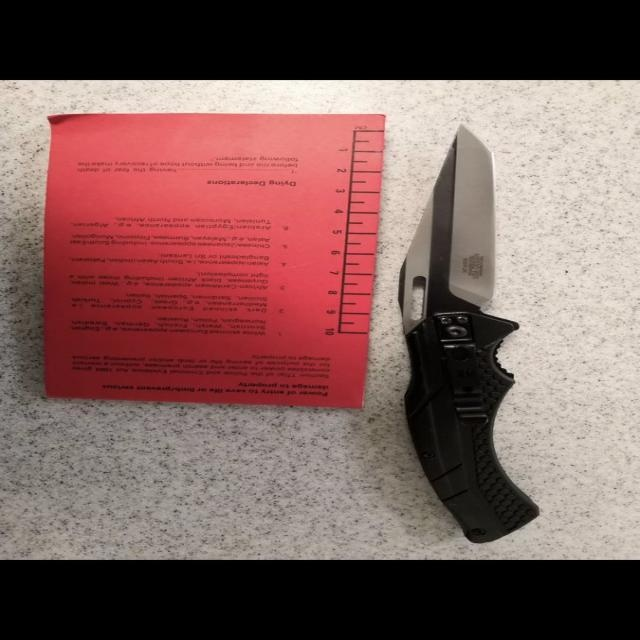

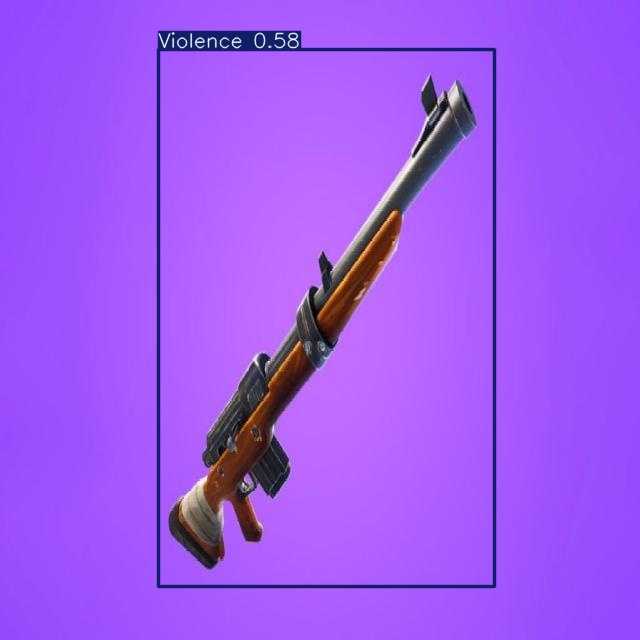

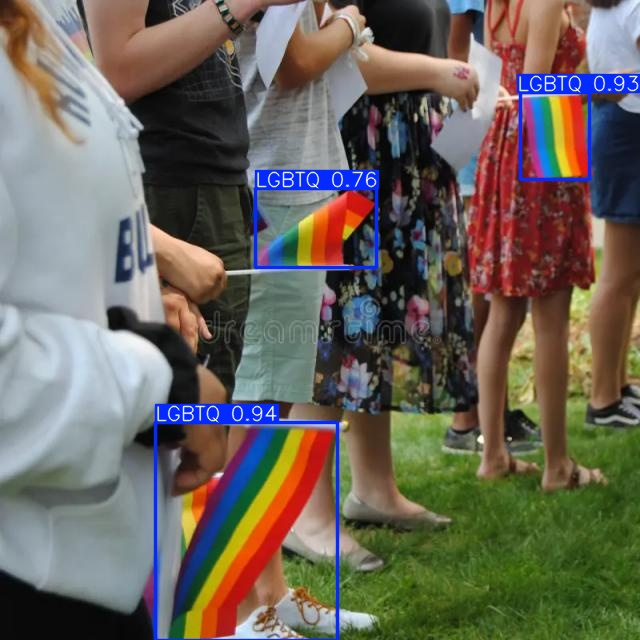

In [ ]:
import glob
from IPython.display import Image,display

for image_path in glob.glob(f'{os.getcwd()}/runs/detect/predict2/*.jpg')[:80]:
  display(Image(filename=image_path,width=600))
  print("\n")